In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from datetime import datetime

In [ ]:
df = pd.read_csv('/content/Sacramentorealestatetransactions.csv')
df

,street,city,zip,state,beds,baths,sq__ft,type,sale_date,price,latitude,longitude
0,3526 HIGH ST,SACRAMENTO,95838,CA,2,1,836,Residential,Wed May 21 00:00:00 EDT 2008,59222,38.631913,-121.434879
1,51 OMAHA CT,SACRAMENTO,95823,CA,3,1,1167,Residential,Wed May 21 00:00:00 EDT 2008,68212,38.478902,-121.431028
2,2796 BRANCH ST,SACRAMENTO,95815,CA,2,1,796,Residential,Wed May 21 00:00:00 EDT 2008,68880,38.618305,-121.443839
3,2805 JANETTE WAY,SACRAMENTO,95815,CA,2,1,852,Residential,Wed May 21 00:00:00 EDT 2008,69307,38.616835,-121.439146
4,6001 MCMAHON DR,SACRAMENTO,95824,CA,2,1,797,Residential,Wed May 21 00:00:00 EDT 2008,81900,38.519470,-121.435768
...,...,...,...,...,...,...,...,...,...,...,...,...
980,9169 GARLINGTON CT,SACRAMENTO,95829,CA,4,3,2280,Residential,Thu May 15 00:00:00 EDT 2008,232425,38.457679,-121.359620
981,6932 RUSKUT WAY,SACRAMENTO,95823,CA,3,2,1477,Residential,Thu May 15 00:00:00 EDT 2008,234000,38.499893,-121.458890
982,7933 DAFFODIL WAY,CITRUS HEIGHTS,95610,CA,3,2,1216,Residential,Thu May 15 00:00:00 EDT 2008,235000,38.708824,-121.256803
983,8304 RED FOX WAY,ELK GROVE,95758,CA,4,2,1685,Residential,Thu May 15 00:00:00 EDT 2008,235301,38.417000,-121.397424


#1.Create a grid of scatter plots with each one representing the sq_ft distribution in a single zipcode, please also include ticks, labels and legend in your plot

<ipython-input-5-4fb85c60c843>:23: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend(axs, labels=zipcode_data.index, loc='lower center', ncol=4)


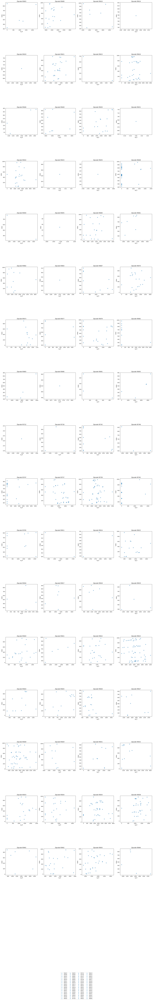

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

zipcode_data = df.groupby('zip')['sq__ft'].mean()

fig, axs = plt.subplots(nrows=17, ncols=4, figsize=(25, 150))
axs = axs.flatten()


for i, zip_code in enumerate(zipcode_data.index):
    ax = axs[i]
    zip_df = df.loc[df['zip'] == zip_code]
    ax.scatter(zip_df['sq__ft'], zip_df.index, alpha=0.5)
    ax.set_xlabel('sq_ft')
    ax.set_ylabel('index')
    ax.set_title(f'Zipcode {zip_code}')


fig.legend(axs, labels=zipcode_data.index, loc='lower center', ncol=4)

plt.subplots_adjust(hspace=1)
plt.show()


#Testcase

<ipython-input-19-f460d3100d8b>:31: UserWarning: You have mixed positional and keyword arguments, some input may be discarded.
  fig.legend(axs, labels=postal_code_data.index, loc='lower center', ncol=4)


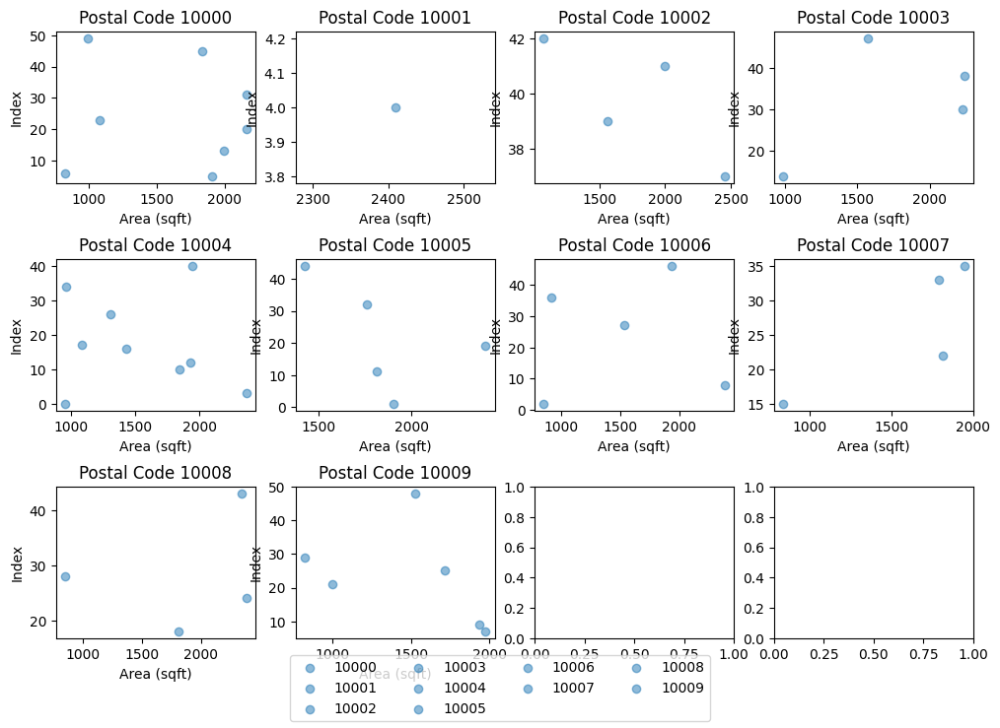

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


data2 = {'postal_code': np.random.randint(10000, 10010, 50),
         'area_sqft': np.random.randint(800, 2500, 50)}
df2 = pd.DataFrame(data2)


postal_code_data = df2.groupby('postal_code')['area_sqft'].mean()

# Calculate the number of plots based on unique postal codes
num_plots = len(postal_code_data)
num_rows = (num_plots // 4) + (num_plots % 4 > 0)

# Create figure with grid of scatter plots
fig, axs = plt.subplots(nrows=num_rows, ncols=4, figsize=(12, 8))
axs = axs.flatten()


for i, code in enumerate(postal_code_data.index):
    ax = axs[i]
    subset = df2[df2['postal_code'] == code]
    ax.scatter(subset['area_sqft'], subset.index, alpha=0.5)
    ax.set_xlabel('Area (sqft)')
    ax.set_ylabel('Index')
    ax.set_title(f'Postal Code {code}')


fig.legend(axs, labels=postal_code_data.index, loc='lower center', ncol=4)

plt.subplots_adjust(hspace=0.5)
plt.show()





#2.Create a grid of scatter plots with each one representing the price distribution in a single zipcode, annotate the highest and lowest price ones for each category of real estate: condo, residential and multi-family, please also include ticks, labels and legend in your plot


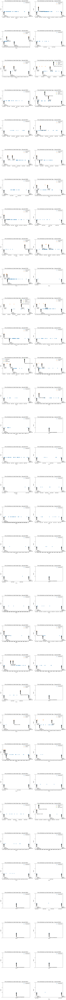

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


types = ['Residential', 'Condo', 'Multi-Family']
fig, axes = plt.subplots(34, 2, figsize=(15, 250))
axes = axes.ravel()
zipcodes = df['zip'].unique()


for idx, zipcode in enumerate(zipcodes):
    ax = axes[idx]
    subset = df[df['zip'] == zipcode]
    index = 0


    for i, real_estate_type in enumerate(types):
        subsets = subset[subset['type'] == real_estate_type]
        if len(subsets) != 0:
            ax.scatter(subsets['price'], [index] * len(subsets), s=50, alpha=0.5)

            # Annotate highest and lowest price
            if len(subsets) == 1:
                ax.annotate('High&Low {}'.format(real_estate_type), xy=(max(subsets['price']), index),
                            xytext=(max(subsets['price']), index - 1),
                            arrowprops=dict(facecolor='black', shrink=0.05))
            else:
                ax.annotate('Highest\n{}'.format(real_estate_type), xy=(max(subsets['price']), index),
                            xytext=(max(subsets['price']), index - 1),
                            arrowprops=dict(facecolor='black', shrink=0.05))
                ax.annotate('Lowest\n{}'.format(real_estate_type), xy=(min(subsets['price']), index),
                            xytext=(min(subsets['price']), index - 1),
                            arrowprops=dict(facecolor='black', shrink=0.05))
            index += 1


    ax.set_title('Price Distribution by Real Estate Type - Zipcode {}'.format(zipcode))
    ax.set_xlabel('Price')
    ax.set_ylabel('Index')
    ax.set_xticks(range(min(subset['price']), max(subset['price']), 50000))
    ax.set_xticklabels(['${:,.0f}'.format(x) for x in range(min(subset['price']), max(subset['price']), 50000)])
    ax.set_yticks(range(-1, len(types)))
    ax.set_yticklabels(range(-1, len(types)))
    ax.legend(types)


fig.subplots_adjust(hspace=1)


plt.show()


#Testcase

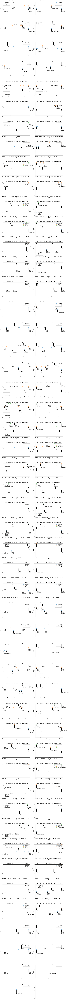

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


data = {'zip': np.random.randint(90000, 90100, 500),
        'type': np.random.choice(['Residential', 'Condo', 'Multi-Family'], 500),
        'price': np.random.randint(100000, 500000, 500)}
df = pd.DataFrame(data)


types = ['Residential', 'Condo', 'Multi-Family']


zipcodes = df['zip'].unique()


num_subplots = len(zipcodes)
num_rows = (num_subplots // 2) + (num_subplots % 2)


fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 5))
axes = axes.ravel()


for idx, zipcode in enumerate(zipcodes):
    ax = axes[idx]
    subset = df[df['zip'] == zipcode]
    index = 1

    for real_estate_type in types:
        subsets = subset[subset['type'] == real_estate_type]
        if not subsets.empty:
            ax.scatter(subsets['price'], [index] * len(subsets), s=50, alpha=0.5)
            # Annotate highest and lowest price
            if len(subsets) == 1:
                ax.annotate('High&Low {}'.format(real_estate_type), xy=(max(subsets['price']), index),
                            xytext=(max(subsets['price']), index - 1),
                            arrowprops=dict(facecolor='black', shrink=0.05))
            else:
                ax.annotate('Highest\n{}'.format(real_estate_type), xy=(max(subsets['price']), index),
                            xytext=(max(subsets['price']), index - 1),
                            arrowprops=dict(facecolor='black', shrink=0.05))
                ax.annotate('Lowest\n{}'.format(real_estate_type), xy=(min(subsets['price']), index),
                            xytext=(min(subsets['price']), index - 1),
                            arrowprops=dict(facecolor='black', shrink=0.05))
            index += 1

    ax.set_title('Price Distribution by Real Estate Type - Zipcode {}'.format(zipcode))
    ax.set_xlabel('Price')
    ax.set_ylabel('Index')
    ax.set_xticks(range(min(subset['price']), max(subset['price']), 50000))
    ax.set_xticklabels(['${:,.0f}'.format(x) for x in range(min(subset['price']), max(subset['price']), 50000)])
    ax.set_yticks(range(-1, len(types)))
    ax.set_yticklabels(range(-1, len(types)))
    ax.legend(types)


fig.subplots_adjust(hspace=0.5)


plt.show()


#3.Create a grid of bar plots with each one representing a single zipcode and in that zipcode the sq_ft distribution is grouped by the category of condo, residential and multi-family, please also include ticks, labels and legend in your plot

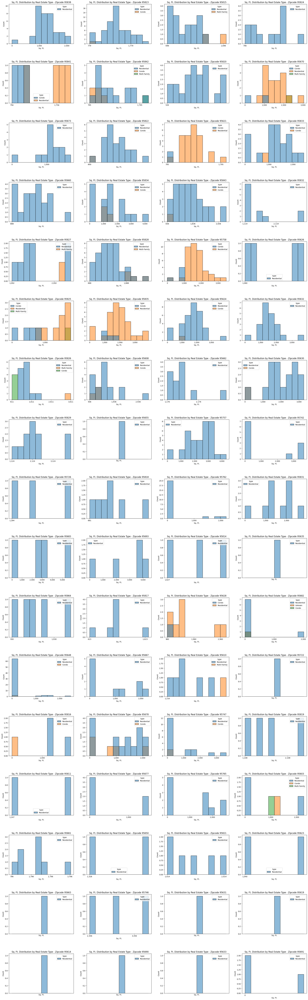

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


zipcodes = df['zip'].unique()


fig, axes = plt.subplots(17, 4, figsize=(30, 100))
axes = axes.ravel()


for idx, zipcode in enumerate(zipcodes):
    ax = axes[idx]

    subset = df[df['zip'] == zipcode]

    sns.histplot(subset, x='sq__ft', alpha=0.5, hue='type', bins=10, ax=ax)

    ax.set_title('Sq. Ft. Distribution by Real Estate Type - Zipcode {}'.format(zipcode))
    ax.set_xlabel('Sq. Ft.')
    ax.set_ylabel('Count')
    ax.set_xticks(range(min(subset['sq__ft']), max(subset['sq__ft']), 1000))
    ax.set_xticklabels(['{:,.0f}'.format(x) for x in range(min(subset['sq__ft']), max(subset['sq__ft']), 1000)])


fig.subplots_adjust(hspace=0.5)


plt.show()


#Test case

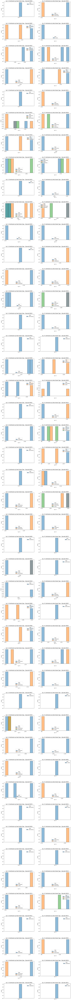

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


data = {'zip': np.random.randint(90000, 90100, 200),
        'type': np.random.choice(['condo', 'residential', 'multi-family'], 200),
        'sq__ft': np.random.randint(800, 3000, 200)}
df = pd.DataFrame(data)


unique_zipcodes = df['zip'].unique()


num_subplots = len(unique_zipcodes)
num_rows = (num_subplots // 2) + (num_subplots % 2 > 0)
fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 5))
axes = axes.ravel()


for idx, zipcode in enumerate(unique_zipcodes):
    ax = axes[idx]
    subset = df[df['zip'] == zipcode]
    sns.histplot(subset, x='sq__ft', alpha=0.5, hue='type', bins=10, ax=ax)
    ax.set_title(f'Sq. Ft. Distribution by Real Estate Type - Zipcode {zipcode}')
    ax.set_xlabel('Sq. Ft.')
    ax.set_ylabel('Count')
    ax.set_xticks(range(min(subset['sq__ft']), max(subset['sq__ft']), 500))
    ax.set_xticklabels(['{:,.0f}'.format(x) for x in range(min(subset['sq__ft']), max(subset['sq__ft']), 500)])


fig.subplots_adjust(hspace=0.5)


plt.show()


#4.Create a grid of bar plots with each one representing a single zipcode and in that zipcode the price distribution is grouped by the category of condo, residential and multi-family, please also include ticks, labels and legend in your plot

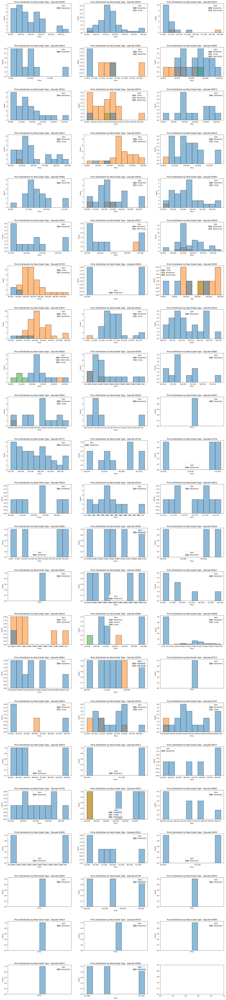

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



zipcodes = df['zip'].unique()


num_subplots = len(zipcodes)
num_rows = (num_subplots // 3) + (1 if num_subplots % 3 != 0 else 0)


fig, axes = plt.subplots(num_rows, 3, figsize=(25, num_rows * 5))
axes = axes.ravel()


for idx, zipcode in enumerate(zipcodes):
    ax = axes[idx]

    subset = df[df['zip'] == zipcode]

    sns.histplot(subset, x='price', alpha=0.5, hue='type', bins=10, ax=ax)

    ax.set_title('Price Distribution by Real Estate Type - Zipcode {}'.format(zipcode))
    ax.set_xlabel('Price')
    ax.set_ylabel('Count')
    ax.set_xticks(range(min(subset['price']), max(subset['price']), 50000))
    ax.set_xticklabels(['{:,.0f}'.format(x) for x in range(min(subset['price']), max(subset['price']), 50000)])


fig.subplots_adjust(hspace=0.5)


plt.show()


#Testcase

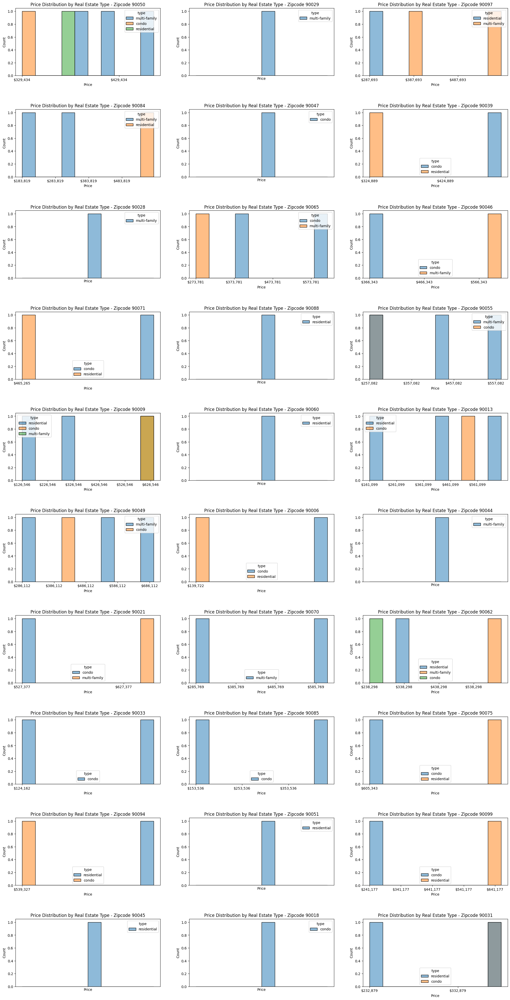

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Sample data
data = {'zip': np.random.randint(90000, 90100, 150),
        'type': np.random.choice(['condo', 'residential', 'multi-family'], 150),
        'price': np.random.randint(100000, 700000, 150)}
df = pd.DataFrame(data)


zipcodes = df['zip'].unique()


f, axes = plt.subplots(10, 3, figsize=(25, 50))
axes = axes.ravel()


for zipcode, ax in zip(zipcodes, axes):
    subset = df[df['zip'] == zipcode]
    sns.histplot(subset, x='price', alpha=0.5, hue='type', bins=10, ax=ax)
    ax.set_title('Price Distribution by Real Estate Type - Zipcode {}'.format(zipcode))
    ax.set_xlabel('Price')
    ax.set_ylabel('Count')
    ax.set_xticks(range(min(subset['price']), max(subset['price']), 100000))
    ax.set_xticklabels(['${:,.0f}'.format(x) for x in range(min(subset['price']), max(subset['price']), 100000)])


f.subplots_adjust(hspace=0.5)


plt.show()


#5.Plot the average price distribution based on zipcode for each category of real estate: condo, residential and multi-family, please also include ticks, labels and legend in your plot

<ipython-input-11-e6b4ca7cbdd9>:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mean = df.groupby(['zip', 'type']).mean().reset_index().rename(columns={'zip': 'zipcode', 'type': 'category'})


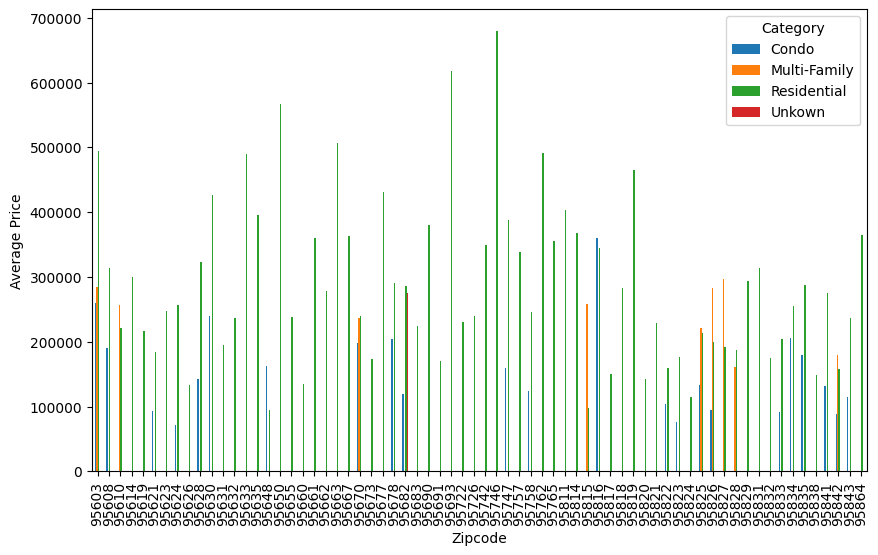

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df_mean = df.groupby(['zip', 'type']).mean().reset_index().rename(columns={'zip': 'zipcode', 'type': 'category'})


df_pivot = df_mean.pivot(index='zipcode', columns='category', values='price')


fig, ax = plt.subplots(figsize=(10, 6))
df_pivot.plot(kind='bar', ax=ax)


ax.set_xlabel('Zipcode')
ax.set_ylabel('Average Price')
ax.legend(title='Category', loc='best')


plt.show()


#Testcase

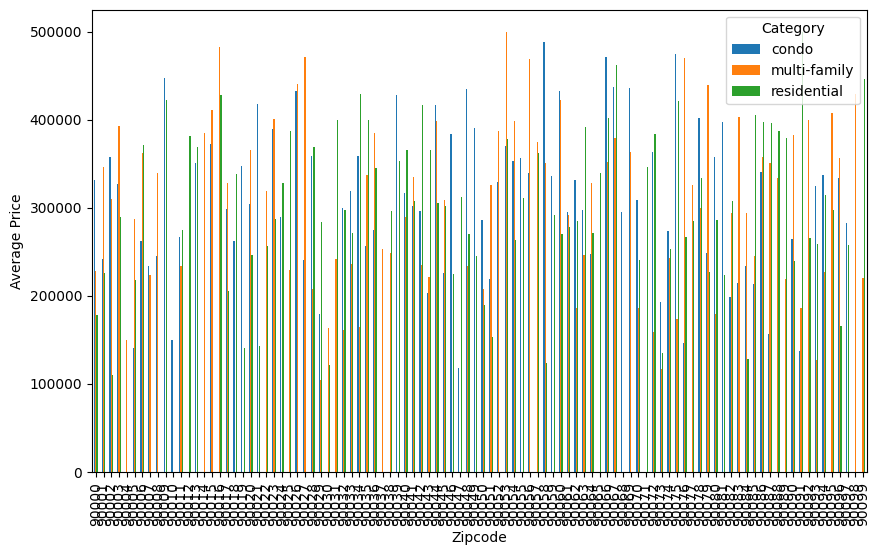

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


data = {'zip': np.random.randint(90000, 90100, 500),
        'type': np.random.choice(['condo', 'residential', 'multi-family'], 500),
        'price': np.random.randint(100000, 500000, 500)}
df = pd.DataFrame(data)


df_mean = df.groupby(['zip', 'type']).mean().reset_index().rename(columns={'zip': 'zipcode', 'type': 'category'})


df_pivot = df_mean.pivot(index='zipcode', columns='category', values='price')


fig, ax = plt.subplots(figsize=(10, 6))
df_pivot.plot(kind='bar', ax=ax)


ax.set_xlabel('Zipcode')
ax.set_ylabel('Average Price')
ax.legend(title='Category', loc='best')


plt.show()


#6.Plot the average price distribution based on city for each category of real estate: condo, residential and multi-family, please also include ticks, labels and legend in your plot

<ipython-input-12-ee33a04d620d>:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mean = df.groupby(['city', 'type']).mean().reset_index().rename(columns={'city': 'City', 'type': 'Category'})


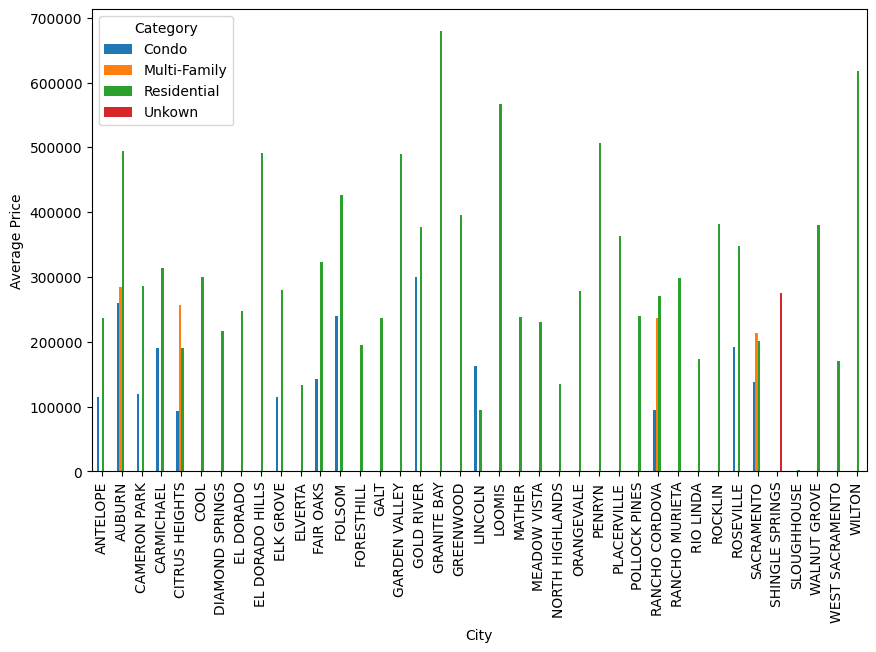

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df_mean = df.groupby(['city', 'type']).mean().reset_index().rename(columns={'city': 'City', 'type': 'Category'})

df_pivot = df_mean.pivot(index='City', columns='Category', values='price')

fig, ax = plt.subplots(figsize=(10, 6))
df_pivot.plot(kind='bar', ax=ax)

ax.set_xlabel('City')
ax.set_ylabel('Average Price')
ax.legend(title='Category', loc='best')

plt.show()


#Testcase

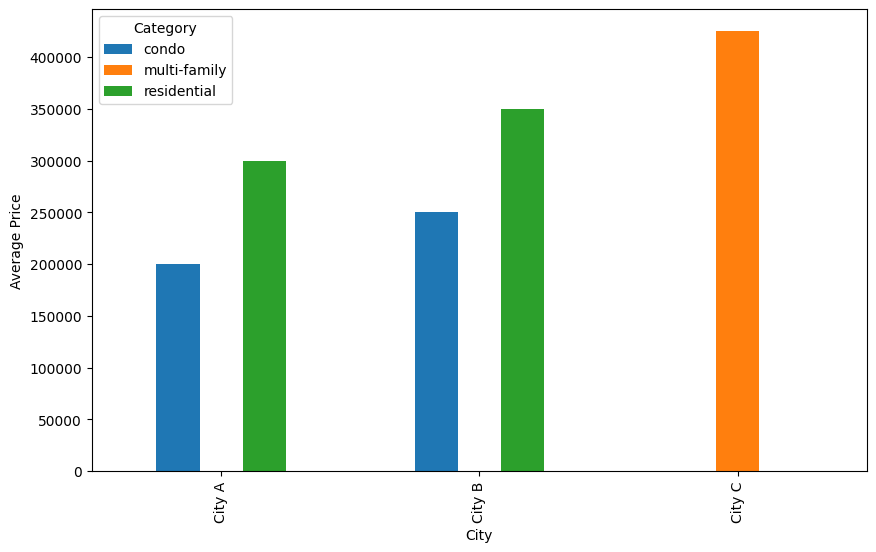

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


data = {'city': ['City A', 'City A', 'City B', 'City B', 'City C', 'City C'],
        'type': ['condo', 'residential', 'condo', 'residential', 'multi-family', 'multi-family'],
        'price': [200000, 300000, 250000, 350000, 400000, 450000]}
df = pd.DataFrame(data)

df_mean = df.groupby(['city', 'type']).mean().reset_index().rename(columns={'city': 'City', 'type': 'Category'})


df_pivot = df_mean.pivot(index='City', columns='Category', values='price')


fig, ax = plt.subplots(figsize=(10, 6))
df_pivot.plot(kind='bar', ax=ax)


ax.set_xlabel('City')
ax.set_ylabel('Average Price')
ax.legend(title='Category', loc='best')

plt.show()


# SP500.csv file

In [ ]:
df = pd.read_csv('/content/SP500.csv')
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,1950-01-03,16.660000,16.660000,16.660000,16.660000,16.660000,1260000
1,1950-01-04,16.850000,16.850000,16.850000,16.850000,16.850000,1890000
2,1950-01-05,16.930000,16.930000,16.930000,16.930000,16.930000,2550000
3,1950-01-06,16.980000,16.980000,16.980000,16.980000,16.980000,2010000
4,1950-01-09,17.080000,17.080000,17.080000,17.080000,17.080000,2520000
...,...,...,...,...,...,...,...
17186,2018-04-23,2675.399902,2682.860107,2657.989990,2670.290039,2670.290039,3017480000
17187,2018-04-24,2680.800049,2683.550049,2617.320068,2634.560059,2634.560059,3706740000
17188,2018-04-25,2634.919922,2645.300049,2612.669922,2639.399902,2639.399902,3499440000
17189,2018-04-26,2651.649902,2676.479980,2647.159912,2666.939941,2666.939941,3665720000


#7.Plot daily gain/loss for January of 2018, annotate the highest daily gain and its date, the highest daily loss and its date in January 2018

<ipython-input-14-86eda451527d>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_jan['profit/loss'] = df_jan['Close'] - df_jan['Open']


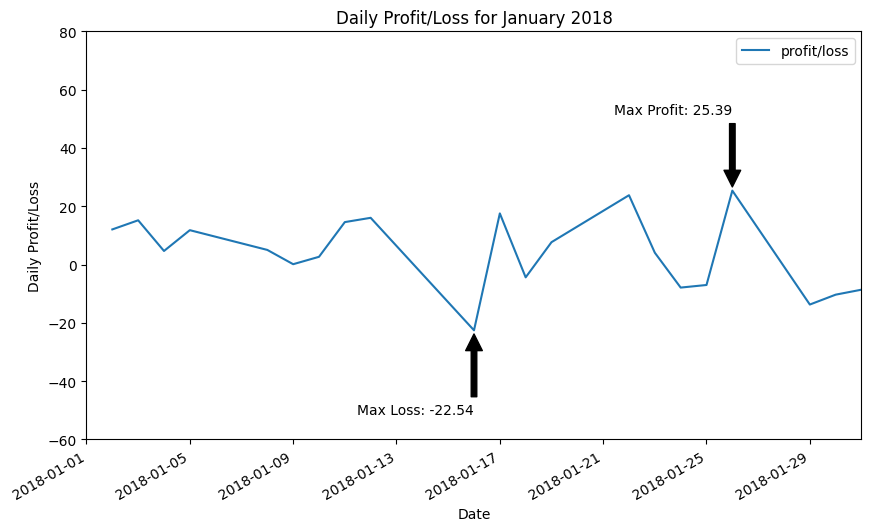

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df_jan = df[df['Date'].str.startswith('2018-01')]
df_jan['profit/loss'] = df_jan['Close'] - df_jan['Open']


fig, ax = plt.subplots(figsize=(10, 6))


spx = df_jan[['Date', 'profit/loss']].set_index('Date')
spx.index = pd.to_datetime(spx.index)
spx.plot(ax=ax)

# Calculate and annotate max profit
max_profit = spx['profit/loss'].max()
max_profit_date = spx[spx['profit/loss'] == max_profit].index[0]
ax.annotate(f'Max Profit: {max_profit:.2f}', xy=(max_profit_date, max_profit),
            xytext=(max_profit_date, max_profit + 30),
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='top')

# Calculate and annotate max loss
max_loss = spx['profit/loss'].min()
max_loss_date = spx[spx['profit/loss'] == max_loss].index[0]
ax.annotate(f'Max Loss: {max_loss:.2f}', xy=(max_loss_date, max_loss),
            xytext=(max_loss_date, max_loss - 25),
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='right', verticalalignment='top')


ax.set_xlabel('Date')
ax.set_ylabel('Daily Profit/Loss')
ax.set_title('Daily Profit/Loss for January 2018')
ax.set_xlim(['2018-01-01', '2018-01-31'])
ax.set_ylim([-60, 80])


plt.show()


#Testcase

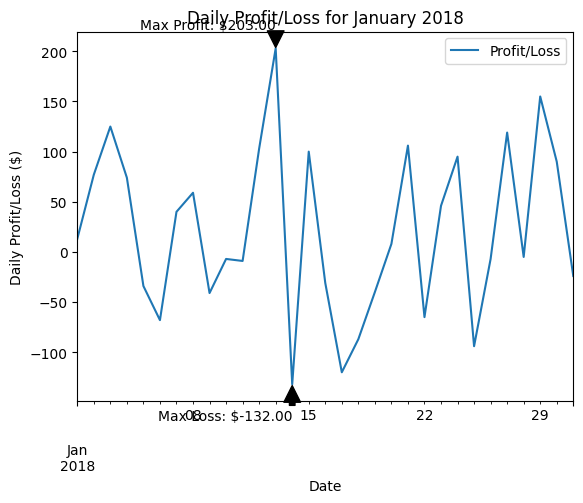

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


dates = pd.date_range(start='2018-01-01', end='2018-01-31')
prices = np.random.randint(100, 300, len(dates))
opens = np.random.randint(90, 250, len(dates))
df = pd.DataFrame({'Date': dates, 'Close': prices, 'Open': opens})


df_jan = df[df['Date'].dt.month == 1]


df_jan['Profit/Loss'] = df_jan['Close'] - df_jan['Open']


fig, ax = plt.subplots()
df_jan.plot(x='Date', y='Profit/Loss', ax=ax)

# Annotate highest daily gain
max_profit = df_jan['Profit/Loss'].max()
max_profit_date = df_jan.loc[df_jan['Profit/Loss'].idxmax(), 'Date']
ax.annotate(f'Max Profit: ${max_profit:.2f}', xy=(max_profit_date, max_profit),
            xytext=(max_profit_date, max_profit + 30),
            arrowprops=dict(facecolor='black', shrink=0.05), horizontalalignment='right',
            verticalalignment='top')


max_loss = df_jan['Profit/Loss'].min()
max_loss_date = df_jan.loc[df_jan['Profit/Loss'].idxmin(), 'Date']
ax.annotate(f'Max Loss: ${max_loss:.2f}', xy=(max_loss_date, max_loss),
            xytext=(max_loss_date, max_loss - 25),
            arrowprops=dict(facecolor='black', shrink=0.05), horizontalalignment='right',
            verticalalignment='top')

ax.set_xlabel('Date')
ax.set_ylabel('Daily Profit/Loss ($)')
ax.set_title('Daily Profit/Loss for January 2018')


plt.show()


#8.Make pair plot matrix of January 2018 SP500 data on high, low, adj close and volumn

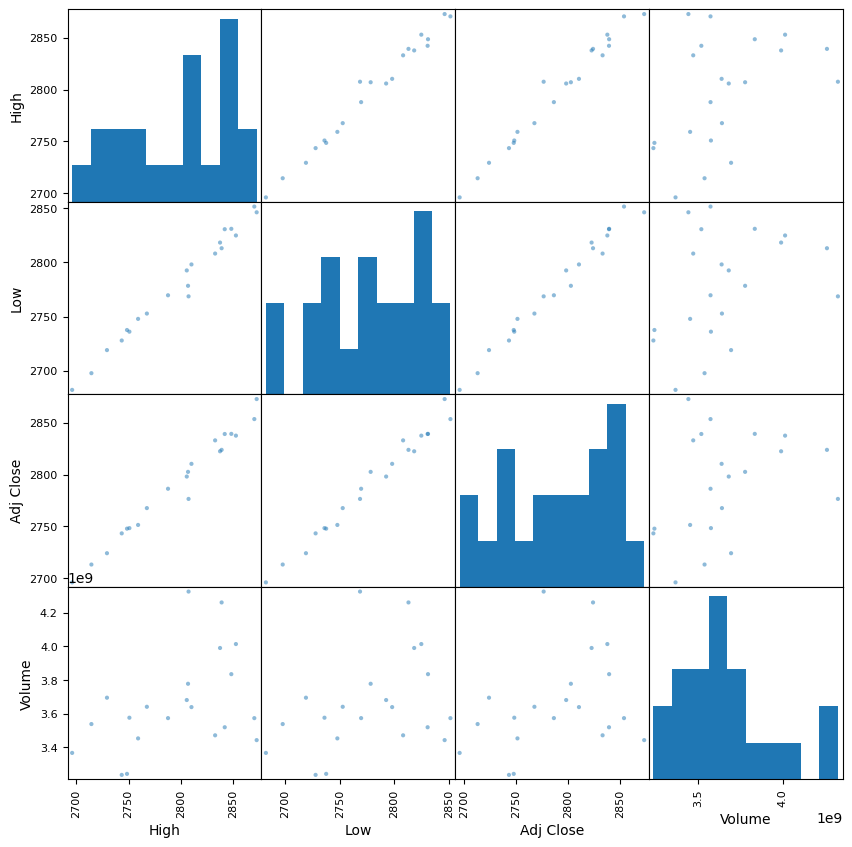

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df2 = df[df['Date'].str.startswith('2018-01')]


columns_to_plot = ['High', 'Low', 'Adj Close', 'Volume']

# Create scatter matrix plot
scatter_matrix = pd.plotting.scatter_matrix(df2[columns_to_plot], figsize=(10, 10))


plt.show()


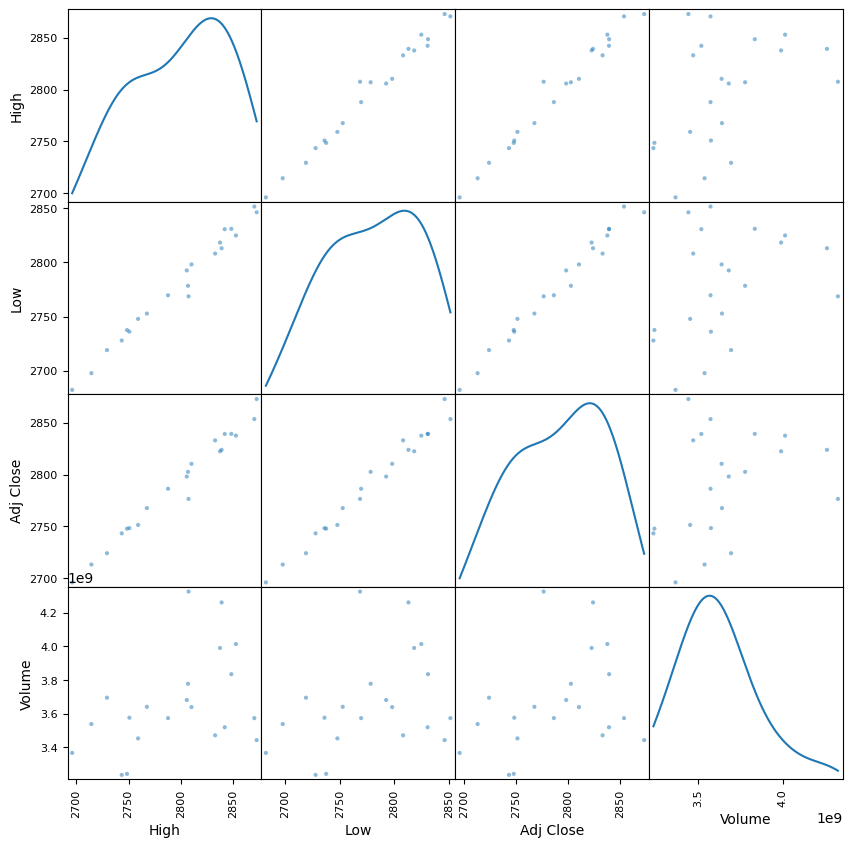

In [ ]:
pd.plotting.scatter_matrix(df2[['High', 'Low', 'Adj Close', 'Volume']], figsize=(10,10),diagonal='kde' )
plt.show()

#Testcase

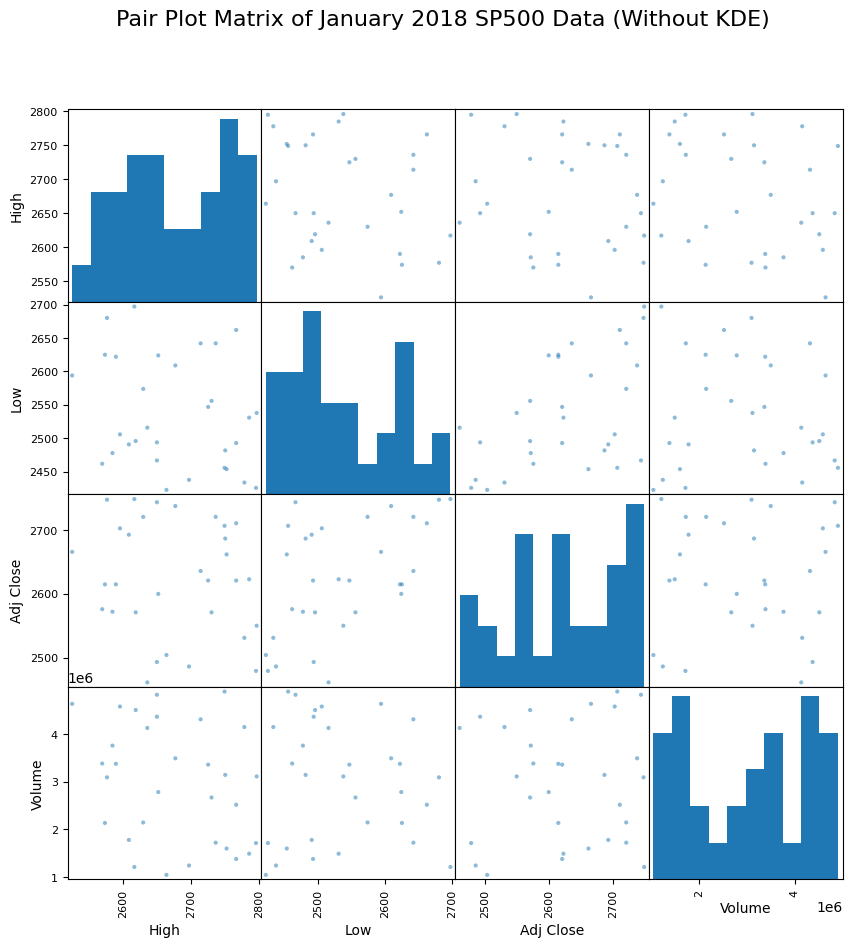

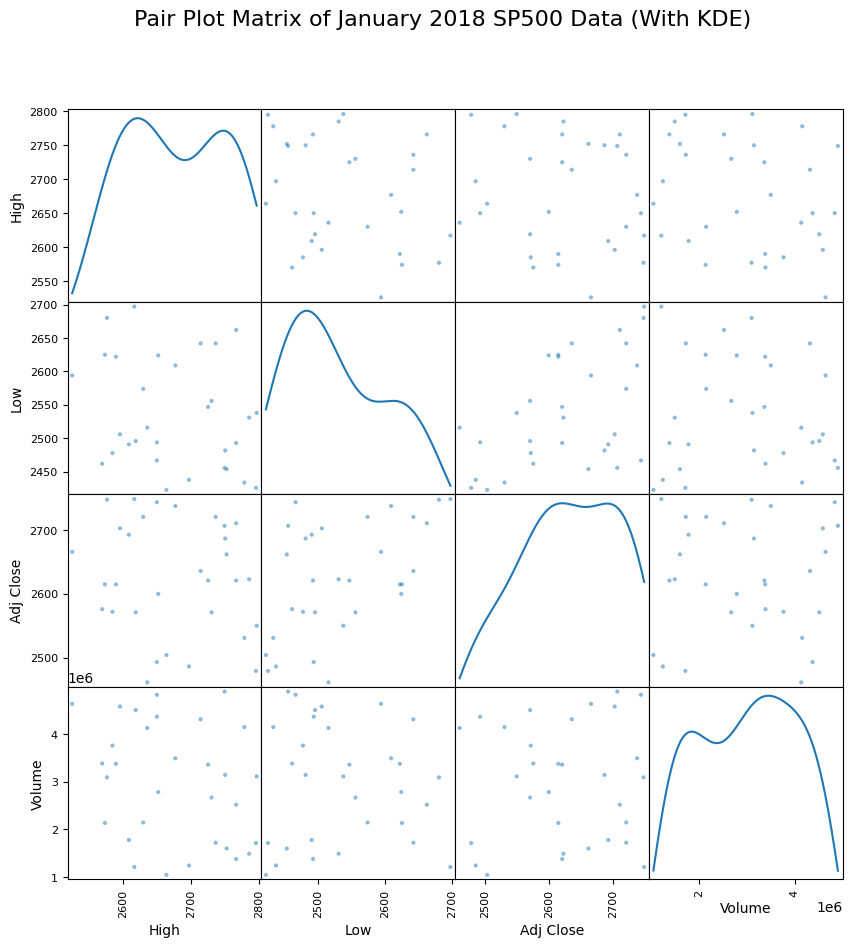

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


dates = pd.date_range(start='2018-01-01', end='2018-01-31')
high_prices = np.random.randint(2500, 2800, len(dates))
low_prices = np.random.randint(2400, 2700, len(dates))
adj_close_prices = np.random.randint(2450, 2750, len(dates))
volumes = np.random.randint(1000000, 5000000, len(dates))

# Create DataFrame
df = pd.DataFrame({
    'Date': dates,
    'High': high_prices,
    'Low': low_prices,
    'Adj Close': adj_close_prices,
    'Volume': volumes
})

df_jan = df[df['Date'].dt.month == 1]

# Create pair plot matrix without KDE
scatter_matrix_no_kde = pd.plotting.scatter_matrix(df_jan[['High', 'Low', 'Adj Close', 'Volume']], figsize=(10, 10))
plt.suptitle('Pair Plot Matrix of January 2018 SP500 Data (Without KDE)', fontsize=16)
plt.show()

# Create pair plot matrix with KDE
scatter_matrix_with_kde = pd.plotting.scatter_matrix(df_jan[['High', 'Low', 'Adj Close', 'Volume']], figsize=(10, 10), diagonal='kde')
plt.suptitle('Pair Plot Matrix of January 2018 SP500 Data (With KDE)', fontsize=16)
plt.show()
